In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [74]:
import numpy as np
import cv2
import os
import sys
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go
from sklearn.decomposition import PCA

In [75]:
original_image = cv2.imread("image.jpeg")

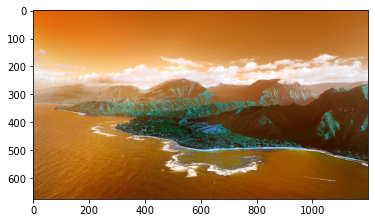

In [76]:
plt.imshow(original_image)

We need to convert our image from RGB Colours Space to HSV becasue R, G, and B components of an object’s color  hue/lightness/chroma or hue/lightness/saturation are often more relevant to describe the image.

In [77]:
img=cv2.cvtColor(original_image,cv2.COLOR_BGR2RGB)

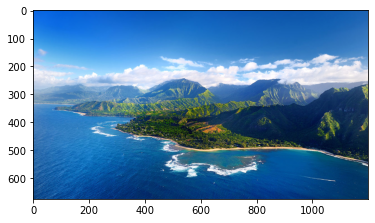

In [78]:
plt.imshow(img)

To vectorize the image in 3D RGB space.

In [79]:
vectorizedOriginal = img.reshape((-1,3))
vectorizedOriginal

array([[ 13, 103, 225],
       [ 13, 103, 225],
       [ 12, 102, 224],
       ...,
       [  0,  49,  92],
       [  0,  49,  92],
       [  0,  48,  91]], dtype=uint8)

In [80]:
vectorized = np.float32(vectorizedOriginal)

In [81]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)


using cv2.kmeans, ref here: https://docs.opencv.org/master/d5/d38/group__core__cluster.html
* data : Data for clustering.
* nclusters(K) K : Number of clusters to split the set by.
* criteria : The algorithm termination criteria, that is, the maximum number of iterations and/or the desired accuracy. The accuracy is specified as criteria.epsilon. As soon as each of the cluster centers moves by less than criteria.epsilon on some iteration, the algorithm stops.
* attempts : Flag to specify the number of times the algorithm is executed using different initial labellings. The algorithm returns the labels that yield the best compactness (see the last function parameter).
* flags :
KMEANS_RANDOM_CENTERS - selects random initial centers in each attempt.
KMEANS_PP_CENTERS - uses kmeans++ center initialization by Arthur and Vassilvitskii.
KMEANS_USE_INITIAL_LABELS - during the first (and possibly the only) attempt, use the user-supplied labels instead of computing them from the initial centers. For the second and further attempts, use the random or semi-random centers. Use one of KMEANS_*_CENTERS flag to specify the exact method.
* centers : Output matrix of the cluster centers, one row per each cluster center.

In [82]:
K = 3
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)

* ret : It is the sum of squared distance from each point to their corresponding centers.
* label : This is the label array where each element marked '0','1',.....
* center : This is array of centers of clusters.

In [83]:
# 3 colors identified with 3 centers
label

array([[0],
       [0],
       [0],
       ...,
       [1],
       [1],
       [1]], dtype=int32)

In [97]:
# Define display function to show scatter plot of the color location segments
def scater_color_segments(vectorized, label, center):
    colors = ['#0d0887', '#46039f', '#7201a8', '#9c179e', '#bd3786', '#d8576b', '#ed7953', '#fb9f3a', '#fdca26', '#f0f921']
    for x in range(len(center)):
        A = vectorized[label.ravel()==x]
        plt.scatter(A[:,0], A[:,1], c = colors[x])
    
    plt.scatter(center[:,0],center[:,1],s = 50,c = 'y', marker = '+')
    plt.xlabel('X - color range 0-255'),plt.ylabel('Y - color range 0-255')
    plt.show()
    
# Define display function to show 3D scatter plot of the color location segments RGB(255,255,255)
def scater_color_segments3D(vectorized, label, center):
    
    for x in range(len(center)):
        A = vectorized[label.ravel()==x]
        B = vectorizedOriginal[label.ravel()==x]
        mydata = go.Scatter3d(x = A[:,0], y = A[:,1], z = A[:,2], 
                      mode='markers', 
                      marker=dict(
                            size=2,
                            color= B[:,2],          # set color to an array/list of desired values
                            colorscale='Viridis',   # choose a colorscale
                            opacity=0.8
                        )
                     )
    myfigure=go.Figure([mydata])
    myfigure.show()   
        
    
    #plt.scatter(center[:,0],center[:,1],s = 50,c = 'y', marker = '+')
    #plt.xlabel('X - color range 0-255'),plt.ylabel('Y - color range 0-255')
    #plt.show()

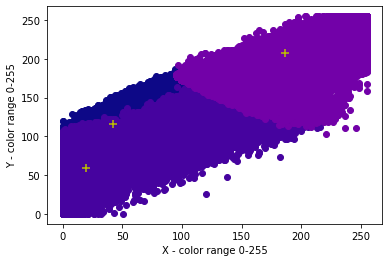

In [98]:
# Now separate the data, Note that only 3 colors were identifies becasue we have passed K=3
scater_color_segments(vectorized, label, center)


In [99]:
scater_color_segments3D(vectorized, label, center)

In [87]:
center = np.uint8(center)

In [88]:
res = center[label.flatten()]
result_image = res.reshape((img.shape))

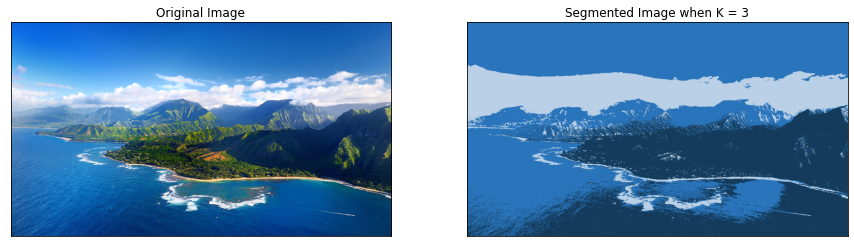

In [17]:
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

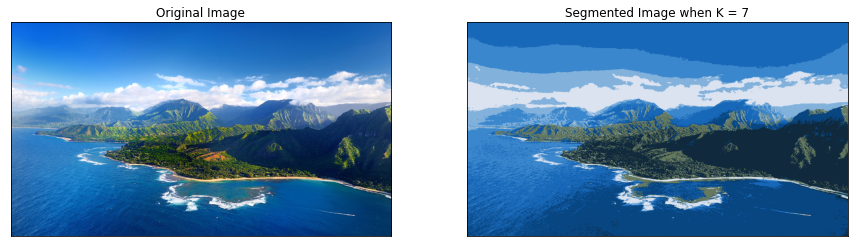

In [18]:
K = 7
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

Now we will see 7 color segments

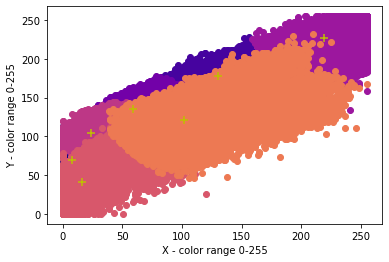

In [19]:
scater_color_segments(vectorized, label, center)

Represent the clustering in 3d since the colors could be plugged ussing (255,255,255)

In [20]:
scater_color_segments3D(vectorized, label, center)

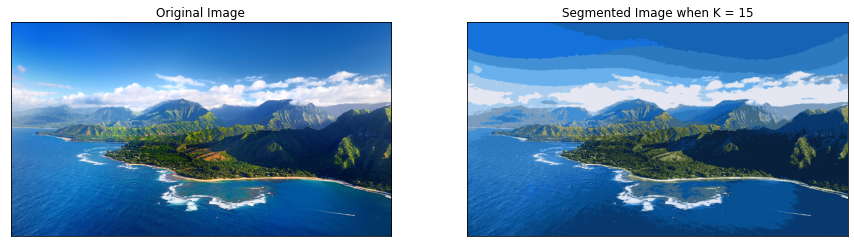

In [21]:
K = 15
attempts=10
ret,label,center=cv2.kmeans(vectorized,K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
result_image = res.reshape((img.shape))
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(result_image)
plt.title('Segmented Image when K = %i' % K), plt.xticks([]), plt.yticks([])
plt.show()

Represent the clustering in 3d since the colors could be plugged ussing (255,255,255)

In [22]:
scater_color_segments3D(vectorized, label, center)

So waht we observe is as we increase the number of clusters to be identified, the picture is getting close to the original.

## Now lets compress the image using PCA and cv2

In [25]:
# Splitting the image in R,G,B arrays.
 
blue,green,red = cv2.split(original_image) 
#it will split the original image into Blue, Green and Red arrays.

Apply Principal Components to Individual Arrays

In [59]:
def show_pca_compressed(components):
    pca = PCA(components)
 
    #Applying to red channel and then applying inverse transform to transformed array.
    red_transformed = pca.fit_transform(red)
    red_inverted = pca.inverse_transform(red_transformed)

    #Applying to Green channel and then applying inverse transform to transformed array.
    green_transformed = pca.fit_transform(green)
    green_inverted = pca.inverse_transform(green_transformed)

    #Applying to Blue channel and then applying inverse transform to transformed array.
    blue_transformed = pca.fit_transform(blue)
    blue_inverted = pca.inverse_transform(blue_transformed)
    
    #When compressing the Image inverse Transformation is necessary to recreate the original dimensions of the base image.
    #In the process of reconstructing the original dimensions from the reduced dimensions, some information is lost as 
    #we keep only selected principal components, 20, 100, 400 in this case.
    
    #Stacking the inverted arrays using dstack function. Here it is important to specify the datatype of
    #our arrays, as most images are of 8 bit. Each pixel is represented by one 8-bit byte.
    img_compressed = (np.dstack((red_inverted, green_inverted, blue_inverted))).astype(np.uint8)
    plt.imshow(img_compressed)

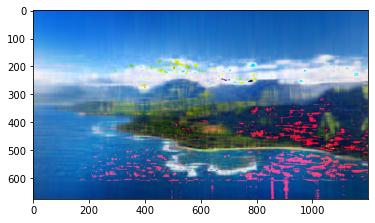

In [66]:
show_pca_compressed(20)

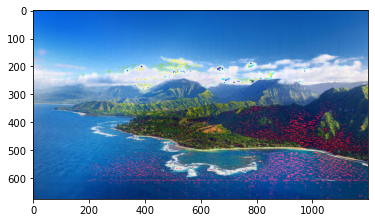

In [63]:
show_pca_compressed(100)

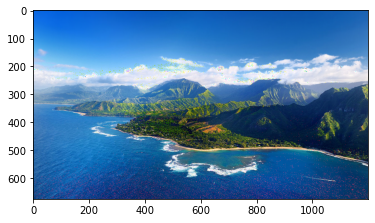

In [64]:
show_pca_compressed(400)

As we can see the higher the components, the higher the qulity of the picture.